In [1]:
import torch
import sys
import time

sys.path.append("/home/atuin/v120bb/v120bb18/UnReflectAnything")
from utilities.visualization import rgb, panelize
from polar_highlighter import PolarHighlighter

if torch.cuda.is_available():
    num_devices = torch.cuda.device_count()
    curr_device = torch.cuda.current_device()
    device_name = torch.cuda.get_device_name(curr_device)
    print(f"CUDA is available: {num_devices} device(s) detected.")
    print(f"Current device id: {curr_device} - {device_name}")
else:
    print("CUDA is not available")
%load_ext autoreload
%autoreload 2


CUDA is available: 1 device(s) detected.
Current device id: 0 - NVIDIA A40


In [2]:
from main import load_and_process_config
from models_utils import load_best_model_by_run
from dataset import from_config
from utilities import tensor_dict_summarize


config = load_and_process_config("config_train.yaml")
config.DATASETS = {"STEREOMIS_TRACKING": config.DATASETS.STEREOMIS_TRACKING}

dataset = from_config(config)["training"]
idataloadr = iter(torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False))


DATASET  [17:25:25] Processing 1 datasets: ['STEREOMIS_TRACKING']

DATASET  [17:25:25] Using all scenes except VAL_SCENES for STEREOMIS_TRACKING training

DATASET  [17:25:25]   ✓ Created training dataset for STEREOMIS_TRACKING: 300 samples (excluding 1 val scenes)

DATASET  [17:25:25]   ✓ Created validation dataset for STEREOMIS_TRACKING: 50 samples from 1 scenes

DATASET  [17:25:25] === Dataset Creation Summary ===

DATASET  [17:25:25] Training:   300 total samples

DATASET  [17:25:25] Validation: 50 total samples

DATASET  [17:25:25] Test:       50 total samples

In [3]:
MODEL_NAMES = [
    # "icy-gorge-754",
    "easy-surf-759",
    # "firm-firefly-771",
    # "zany-salad-770",
    # "cosmic-music-769",
    # "twilight-rain-768",
    # "fresh-gorge-766",
    # "classic-grass-765",
    # "stoic-waterfall-764",
    # "snowy-glade-763",
    # "earnest-resonance-761",
    # "young-monkey-760",
    # "easy-surf-759",
    # "true-planet-757",
    # "laced-moon-756",
]

INFO     [17:37:53] Found valid run to resume: /anvme/workspace/v120bb18-unreflectanything/results/easy-surf-759

INFO     [17:37:53] Latest checkpoint: 
/anvme/workspace/v120bb18-unreflectanything/results/easy-surf-759/models/weights_best.pt

INFO     [17:37:53] Latest epoch: 11

MODEL    [17:37:55] ✓ Decoder 'diffuse': Successfully loaded all 54 state dict keys from weights/rgb_decoder.pth

MODEL    [17:37:55] Loaded pre-trained decoder weights from weights/rgb_decoder.pth

MODEL    [17:37:55] Decoder 'diffuse' un-frozen due to DECODER_LR=0.0001

MODEL    [17:37:55] Decoder 'highlight' un-frozen due to DECODER_LR=0.0005

MODEL    [17:37:56] ✓ Token Inpainter: Successfully loaded all 78 state dict keys from weights/token_inpainter.pth

MODEL    [17:37:56] Loaded pretrained token inpainter weights from weights/token_inpainter.pth


===== Benchmark: easy-surf-759 =====
  Device: NVIDIA A40
  Total parameters: 498.00M
  Peak memory (bytes): 3,655,777,280
  Average inference time (s): 0.106283
  FLOPs (fvcore): FLOP calculation failed: max_pool2d: kernel_size must either be a single int, or a tuple of two ints



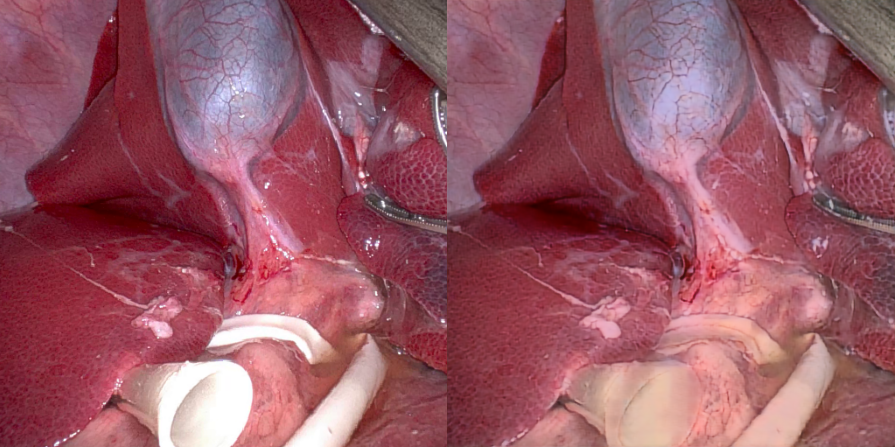

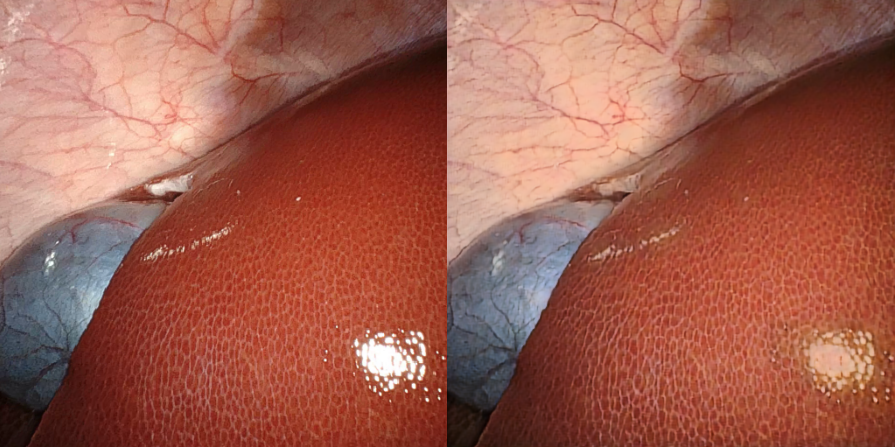

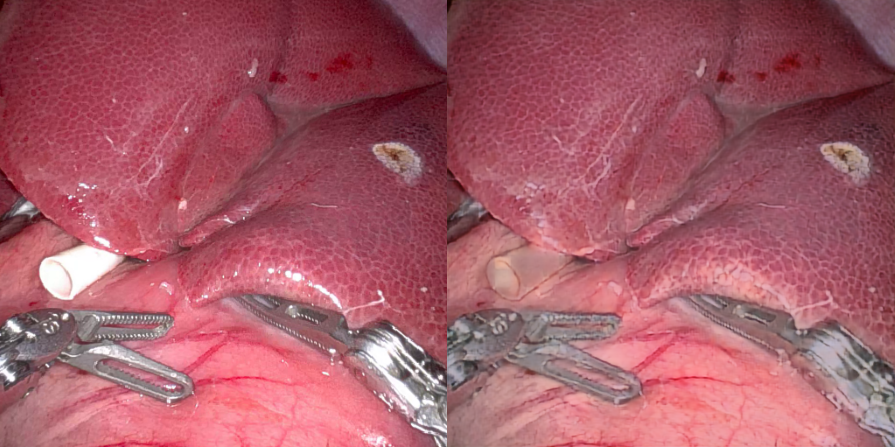

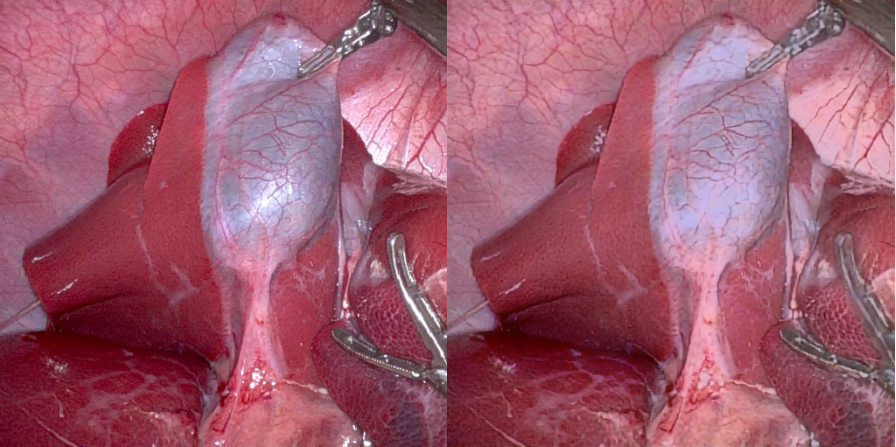

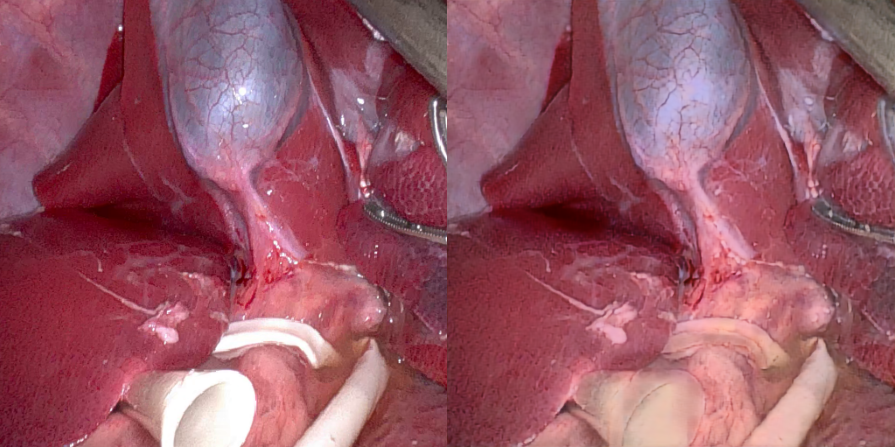

...

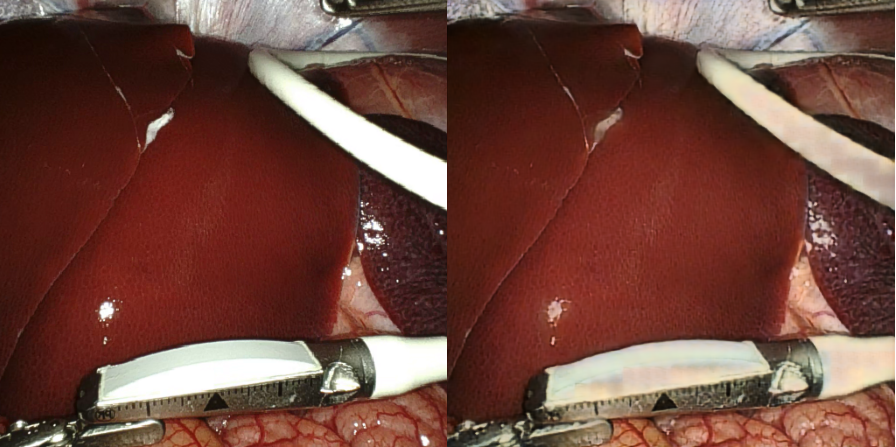

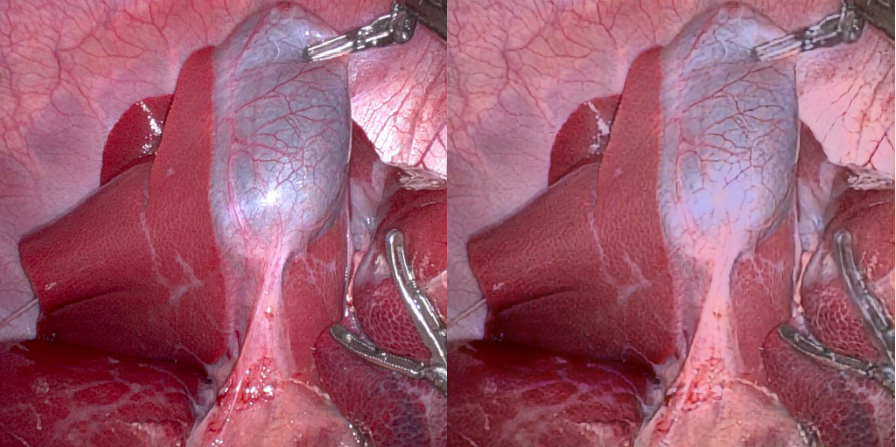

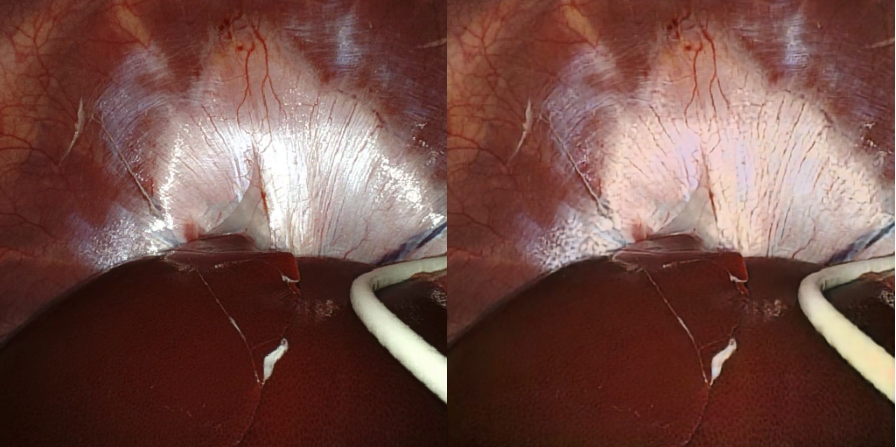

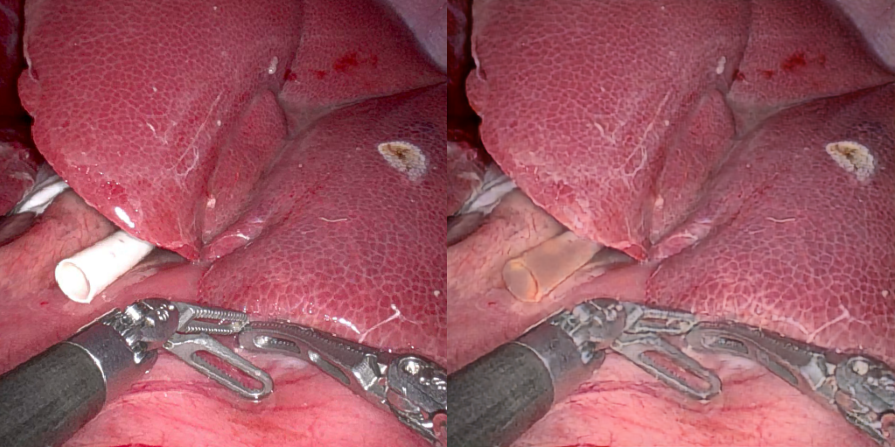

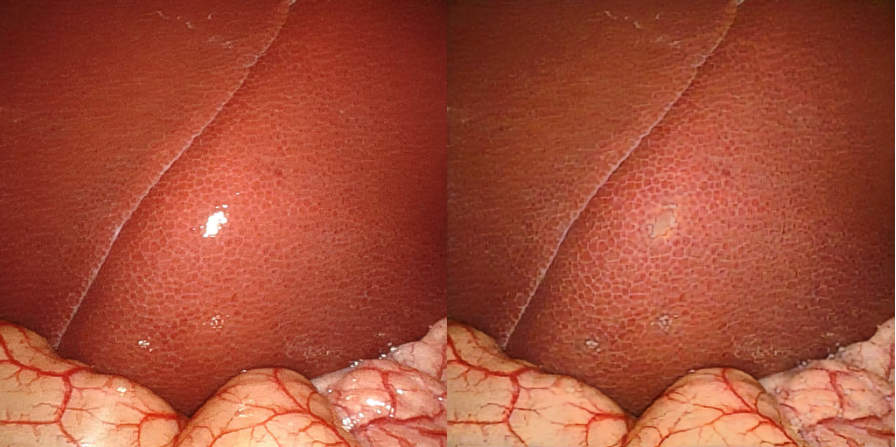

In [6]:
import importlib
import models
import torch
import time
import psutil
from torch.cuda.amp import autocast

importlib.reload(models)
config = load_and_process_config("config_train.yaml")
MODELS = [load_best_model_by_run(model, verbose=False).eval() for model in MODEL_NAMES]
dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)

# FLOPS: Setup
try:
    from fvcore.nn import FlopCountAnalysis, parameter_count_table
except ImportError:
    print("fvcore is not installed. Please install with 'pip install fvcore' if you want FLOP analysis.")

def get_total_params(model):
    return sum(p.numel() for p in model.parameters())

def get_device_of_model(model):
    # Helper to return which cuda device the params live on (or cpu)
    return next(model.parameters()).device

timing_results = []
memory_results = []
param_results = []
gpu_results = []
flops_results = []

# Prepare one batch to use for benchmarking
first_batch = next(iter(dataloader))
first_batch = {
    k: v.cuda(non_blocking=True) if isinstance(v, torch.Tensor) and torch.cuda.is_available() else v
    for k, v in first_batch.items()
}
mask_override = (
    first_batch["raw"].mean(dim=1, keepdim=True)
    > 0.8 * first_batch["raw"].mean(dim=1).max().item()
)
model_input = {"rgb": first_batch["raw"], "inpaint_mask_override": mask_override}

for model, mname in zip(MODELS, MODEL_NAMES):
    # Move model to gpu if available
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    for p in model.parameters():
        p.requires_grad = False

    # Warmup (100 iterations)
    for _ in range(100):
        with torch.no_grad():
            _ = model(model_input)

    # Time forward pass (1000 iterations)
    torch.cuda.empty_cache()
    if torch.cuda.is_available():
        torch.cuda.reset_peak_memory_stats(device)
        start_mem = torch.cuda.memory_allocated(device)
    else:
        start_mem = psutil.Process().memory_info().rss

    times = []
    with torch.no_grad():
        for _ in range(1000):
            torch.cuda.synchronize() if torch.cuda.is_available() else None
            start = time.perf_counter()
            _ = model(model_input)
            torch.cuda.synchronize() if torch.cuda.is_available() else None
            end = time.perf_counter()
            times.append(end - start)

    avg_time = sum(times) / len(times)
    if torch.cuda.is_available():
        peak_mem = torch.cuda.max_memory_allocated(device)
        gpu_info = torch.cuda.get_device_name(device)
    else:
        peak_mem = psutil.Process().memory_info().rss
        gpu_info = "cpu"

    n_params = get_total_params(model)

    # --------- FLOPS calculation -----------
    try:
        # Prepare the right forward input
        # FlopCountAnalysis expects a tuple of positional args
        with torch.no_grad():
            flops = FlopCountAnalysis(model, (model_input,))
            total_flops = flops.total()
            flops_str = f"{total_flops/1e9:.2f} GFLOPs"
    except Exception as e:
        total_flops = None
        flops_str = f"FLOP calculation failed: {e}"

    print(f"\n===== Benchmark: {mname} =====")
    print(f"  Device: {gpu_info}")
    print(f"  Total parameters: {n_params/1e6:.2f}M")
    print(f"  Peak memory (bytes): {peak_mem:,}")
    print(f"  Average inference time (s): {avg_time:.6f}")
    print(f"  FLOPs (fvcore): {flops_str}")
    print("")

    timing_results.append(avg_time)
    memory_results.append(peak_mem)
    param_results.append(n_params)
    gpu_results.append(gpu_info)
    flops_results.append(total_flops)

# Visualization loop (optional): just as before for qualitative outputs
for b, batch in enumerate(dataloader):
    rgbs = [rgb(batch["raw"][0], as_tensor=True, resize=(448, 448))]
    for model, mname in zip(MODELS, MODEL_NAMES):
        batch_on_device = {
            k: v.cuda(non_blocking=True) if isinstance(v, torch.Tensor) and torch.cuda.is_available() else v
            for k, v in batch.items()
        }
        mask_override = (
            batch_on_device["raw"].mean(dim=1, keepdim=True)
            > 0.8 * batch_on_device["raw"].mean(dim=1).max().item()
        )
        model_input = {"rgb": batch_on_device["raw"], "inpaint_mask_override": mask_override}

        with torch.no_grad():
            modelout = model(model_input)
        rgbs.append(
            rgb(modelout["diffuse"][0], as_tensor=True, resize=(448, 448), title={"text": mname})
        )
    rgb(panelize(*rgbs))
    if b > 10:
        break


In [ ]:
    _, pca = rgb(
        modelout["tokens_completed"][-1].reshape(1, 28, 28, 1024).permute(0, 3, 1, 2),
        as_tensor=True,
        resize=(448, 448),
        blackout=True,
        return_pca=True,
    )
    
    rgb(
        panelize(
            rgb(batch["raw"][0], as_tensor=True, resize=(448, 448)),
            # rgb(
            #     modelout["tokens_completed"][-1]
            #     .reshape(1, 28, 28, 1024)
            #     .permute(0, 3, 1, 2),
            #     as_tensor=True,
            #     pca=pca,
            #     resize=(448, 448),
            # ),
            # rgb(
            #     modelout["tokens_completed"][-1]
            #     .reshape(1, 28, 28, 1024)
            #     .permute(0, 3, 1, 2)
            #     * torch.logical_not(modelout["patch_mask"].reshape(1, 1, 28, 28)),
            #     as_tensor=True,
            #     resize=(448, 448),
            #     pca=pca,
            #     blackout=True,
            # ),
            rgb(modelout["diffuse"][0], as_tensor=True, resize=(448, 448)),
            rgb(modelout["highlight"][0], as_tensor=True, resize=(448, 448)),
        )
    )
    if b > 3:
        break


In [5]:
config = load_and_process_config("config_train.yaml")
config.RUN = "curious-moon-751"
config.DATASETS = {"PSD": config.DATASETS.PSD}
dataset = from_config(config)["validation"]
idataloadr = iter(torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False))
model = load_best_model_by_run(config.RUN).eval()
model.token_inpaint._prior_kernel = 5


In [6]:
print(model.token_inpaint._prior_kernel)

In [ ]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False)

for b, batch in enumerate(dataloader):
    batch = {
        k: v.cuda() if isinstance(v, torch.Tensor) and torch.cuda.is_available() else v
        for k, v in batch.items()
    }

    patch_mask = batch["raw"].mean(dim=1, keepdim=True) > 0.8
    model_input = {"rgb": batch["raw"]}  # , "inpaint_mask_override": patch_mask}

    with torch.no_grad():
        modelout = model(model_input)
    _, pca = rgb(
        modelout["tokens_completed"][-1].reshape(1, 28, 28, 1024).permute(0, 3, 1, 2),
        as_tensor=True,
        resize=(448, 448),
        blackout=True,
        return_pca=True,
    )
    rgb(
        panelize(
            rgb(batch["raw"][0], as_tensor=True, resize=(448, 448)),
            # rgb(
            #     modelout["tokens_completed"][-1]
            #     .reshape(1, 28, 28, 1024)
            #     .permute(0, 3, 1, 2),
            #     as_tensor=True,
            #     pca=pca,
            #     resize=(448, 448),
            # ),
            # rgb(
            #     modelout["tokens_completed"][-1]
            #     .reshape(1, 28, 28, 1024)
            #     .permute(0, 3, 1, 2)
            #     * torch.logical_not(modelout["patch_mask"].reshape(1, 1, 28, 28)),
            #     as_tensor=True,
            #     resize=(448, 448),
            #     pca=pca,
            #     blackout=True,
            # ),
            rgb(modelout["diffuse"][0], as_tensor=True, resize=(448, 448)),
            rgb(modelout["highlight"][0], as_tensor=True, resize=(448, 448)),
        )
    )
    if b > 3:
        break


In [ ]:
config = load_and_process_config("config_train.yaml")
config.RUN = "curious-moon-751"

# config.DATASETS = {"PSD": config.DATASETS.PSD}
# dataset = from_config(config)["validation"]
# idataloadr = iter(torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False))
model = load_best_model_by_run(config.RUN).eval()
# model.token_inpaint._prior_kernel = 11

dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False)

for b, batch in enumerate(dataloader):
    batch = {
        k: v.cuda() if isinstance(v, torch.Tensor) and torch.cuda.is_available() else v
        for k, v in batch.items()
    }

    patch_mask = batch["raw"].mean(dim=1, keepdim=True) > 0.8
    model_input = {"rgb": batch["raw"]}  # , "inpaint_mask_override": patch_mask}

    with torch.no_grad():
        modelout = model(model_input)
    _, pca = rgb(
        modelout["tokens_completed"][-1].reshape(1, 28, 28, 1024).permute(0, 3, 1, 2),
        as_tensor=True,
        resize=(448, 448),
        blackout=True,
        return_pca=True,
    )
    rgb(
        panelize(
            rgb(batch["raw"][0], as_tensor=True, resize=(448, 448)),
            # rgb(
            #     modelout["tokens_completed"][-1]
            #     .reshape(1, 28, 28, 1024)
            #     .permute(0, 3, 1, 2),
            #     as_tensor=True,
            #     pca=pca,
            #     resize=(448, 448),
            # ),
            # rgb(
            #     modelout["tokens_completed"][-1]
            #     .reshape(1, 28, 28, 1024)
            #     .permute(0, 3, 1, 2)
            #     * torch.logical_not(modelout["patch_mask"].reshape(1, 1, 28, 28)),
            #     as_tensor=True,
            #     resize=(448, 448),
            #     pca=pca,
            #     blackout=True,
            # ),
            rgb(modelout["diffuse"][0], as_tensor=True, resize=(448, 448)),
            rgb(modelout["highlight"][0], as_tensor=True, resize=(448, 448)),
        )
    )
    if b > 3:
        break


In [ ]:
# torch.save(model.token_inpaint.state_dict(), "/home/atuin/v120bb/v120bb18/UnReflectAnything/weights/token_inpainter.pth")